In [1]:
import dill
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib import ticker
import seaborn as sns
from matplotlib.ticker import LinearLocator, MaxNLocator


plt.rcParams['font.family'] = 'Times New Roman'


from src.analytical import BufferSize # Analytical tool
from src.simulation import Simulation # Simulation tool
from src.job_size_generator import JobSizeGenerator
from src.fixed_point_solver import FixedPointSolver
from src.rejection_modes import RejectionModes 

def Savepickle(obj, doc_path):
  with open(doc_path, 'wb') as file:
         dill.dump(obj, file)     

def Readpickle(doc_path):
    with open(doc_path, 'rb') as file:
        return dill.load(file)

# Simulation

In [2]:
p = np.array([0.3,0.5,0.2])
a_size = np.array([0.5,1.5,2])
a = 1/a_size
size_dist_para = (p,a)
mu_s = 2
lamb = 2
B = 10

model = BufferSize(size_dist_para, mu_s, lamb, B)
model.fit_PR(display=True)

Partially Rejection
1) job arrival rate  : 2.000 jobs / sec
2) average job size  : 1.300 bytes / job
3) data arrival rate : 2.600 bytes / sec
4) transmission rate : 2.000 bytes / sec
5) average occupency : 6.317 / 10.000 bytes, occupency rate 63.172%
6) empty probability : 0.035
7) delta_QoS  , job retransmission proportion  : 22.202%
8) epsilon_QoS, data retransmission proportion : 25.731%
9) t_QoS, average wait time : 3.159 sec


In [5]:
(6.317+1.300 - (2/2)*(1-0.035))/0.22202

29.96126475092334

In [3]:
p = np.array([0.3,0.5,0.2])
a_size = np.array([0.5,1.5,2])
a = 1/a_size
size_dist_para = (p,a)

mu_f = 3
lamb = 2
B = 10

model = BufferSize(size_dist_para, mu_f, lamb, B)
model.fit_PR(display=True)

Partially Rejection
1) job arrival rate  : 2.000 jobs / sec
2) average job size  : 1.300 bytes / job
3) data arrival rate : 2.600 bytes / sec
4) transmission rate : 3.000 bytes / sec
5) average occupency : 3.338 / 10.000 bytes, occupency rate 33.379%
6) empty probability : 0.209
7) delta_QoS  , job retransmission proportion  : 7.335%
8) epsilon_QoS, data retransmission proportion : 8.781%
9) t_QoS, average wait time : 1.113 sec


RejectionModes.FULL
1) average occupency : 9.230 / 10.000 bytes, occupency rate 92.305%
2) empty probability : 0.000
3) delta_QoS  , job retransmission proportion  : 53.890%
4) epsilon_QoS, data retransmission proportion : 87.075%
5) t_QoS, average wait time : 8.343 sec


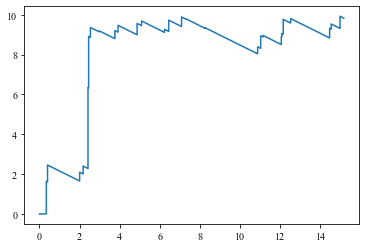

In [14]:
np.random.seed(30)
end_time = 5000
p = np.array([0.3,0.5,0.2])
a_size = np.array([0.5,1.5,2])
a = 1/a_size
size_dist_para = (p,a)

mu = [0.5]
lamb = 3
B = 10

rejection_mode = RejectionModes.FULL

sim = Simulation( end_time = end_time,
                  job_arrival_rate = lamb, 
                  p_values = size_dist_para[0],
                  a_values = size_dist_para[1],
                  buffer_size = B,
                  mus = mu,
                  rejection_mode = rejection_mode)
sim.run()
sim.compute_p0()
sim.compute_qos()
sim.display_result()

plt.plot(sim.event_times[:100], sim.event_buff_occupancies[:100])
plt.show()
                 

RejectionModes.PARTIAL
1) average occupency : 9.798 / 10.000 bytes, occupency rate 97.979%
2) empty probability : 0.000
3) delta_QoS  , job retransmission proportion  : 83.555%
4) epsilon_QoS, data retransmission proportion : 87.072%
5) t_QoS, average wait time : 19.523 sec


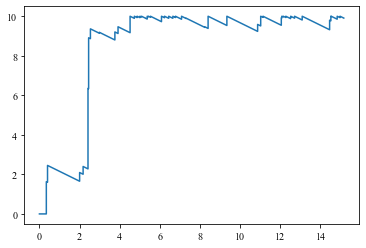

In [396]:
np.random.seed(30)
end_time = 5000
p = np.array([0.3,0.5,0.2])
a_size = np.array([0.5,1.5,2])
a = 1/a_size
size_dist_para = (p,a)

mu = [0.5]
lamb = 3
B = 10

rejection_mode = RejectionModes.PARTIAL

sim = Simulation( end_time = end_time,
                  job_arrival_rate = lamb, 
                  p_values = size_dist_para[0],
                  a_values = size_dist_para[1],
                  buffer_size = B,
                  mus = mu,
                  rejection_mode = rejection_mode)
sim.run_compute()
sim.display_result()

plt.plot(sim.event_times[:100], sim.event_buff_occupancies[:100])
plt.show()

# Simulation
## Simulation : Partially Rejected

In [9]:
lamb = 2 ; end_time = 5000 ; rejection_mode = RejectionModes.PARTIAL
p = np.array([0.3,0.5,0.2]) ; a_size = np.array([0.5,1.5,2]) ; size_dist_para = ( p , 1/a_size )

mu = np.linspace(1, 4,  100)
B  = np.linspace(1, 10, 100)
mu, B = np.meshgrid(mu, B)

occupancyRates = np.empty_like(mu)
emptyProbabilities = np.empty_like(mu)
deltas = np.empty_like(mu)     # job retransmission proportion
epsilons = np.empty_like(mu)   # data retransmission proportion
ts = np.empty_like(mu)         # average wait time
    
for i in tqdm(range(mu.shape[0])):
    for j in range(mu.shape[1]):
        np.random.seed(5)
        sim = Simulation( end_time = end_time,
                  job_arrival_rate = lamb, 
                  p_values = size_dist_para[0],
                  a_values = size_dist_para[1],
                  buffer_size = B[i, j],
                  mus = [mu[i, j]],
                  rejection_mode = rejection_mode)
        
        sim.run_compute()
        
        occupancyRates[i,j] = sim.qos_B_bar_normalized
        emptyProbabilities[i,j] = sim.p0
        deltas[i,j] = sim.qos_delta
        epsilons[i,j] = sim.qos_epsilon
        ts[i,j] = sim.qos_t_bar

# data = {'mu': mu, 
# 'B': B,
# 'occupancyRates': occupancyRates,
# 'emptyProbabilities': emptyProbabilities,
# 'deltas': deltas,
# 'epsilons': epsilons,
# 'ts': ts}

# Savepickle(data, './data/simul_result_5000_PARTIAL.pkl') # save data

  0%|          | 0/50 [00:00<?, ?it/s]

In [140]:
# Read data
data = Readpickle('./data/simul_result_5000_PARTIAL.pkl')
mu , B  = data['mu'] , data['B']

deltas = data['deltas']
epsilons = data['epsilons']
ts = data['ts']
occupancyRates = data['occupancyRates']
B_bar = occupancyRates * B
emptyProbabilities = data['emptyProbabilities']

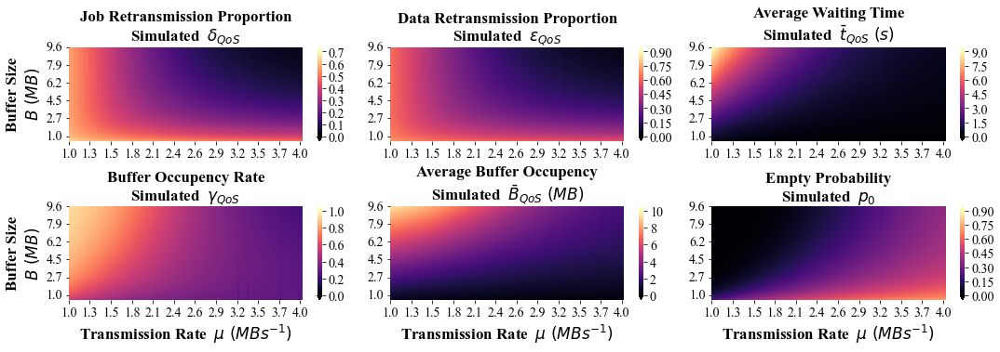

In [143]:
## Plot loss changes
import seaborn as sns
from matplotlib.ticker import MaxNLocator

fig, axes = plt.subplots( 2 , 3 , figsize=( 18, 5 ) )
title_fontsize = 17
tick_size = 14
leg_size = 17

data_lst = [[deltas, epsilons, ts],
            [occupancyRates, B_bar, emptyProbabilities]]

title = [['Job Retransmission Proportion\nSimulated  $\delta_{QoS}$', 
          'Data Retransmission Proportion\nSimulated  $\epsilon_{QoS}$', 
          'Average Waiting Time\nSimulated  $\\bar{t}_{QoS}\ (s)$'],
         ['Buffer Occupency Rate\nSimulated  $\gamma_{QoS}$', 
          'Average Buffer Occupency\nSimulated  $\\bar{B}_{QoS}\ (MB)$', 
          'Empty Probability\nSimulated  $p_{0}$']]

colorbar_nbins = [[7,  8,  7],
                  [5, 5, 7]]

colorbar_vmax  = [[0.7, 0.9, 9],
                  [1.0, 10, 0.9]]

for i in range(2):
    for j in range(3):
        hp = sns.heatmap(np.flipud(data_lst[i][j]), ax=axes[i,j], vmin=0.0, vmax=colorbar_vmax[i][j], cmap='magma', # 'magma'
                         cbar_kws={'orientation': 'vertical', 'extend': 'both'})
        colorbar = hp.collections[0].colorbar
        colorbar.ax.tick_params(labelsize=tick_size)
        colorbar.ax.yaxis.set_major_locator(MaxNLocator(nbins=colorbar_nbins[i][j]))
        
        axes[i,j].set_xticks(np.arange(0, 100, 9))
        axes[i,j].set_xticklabels(np.round(mu[0],1)[::9])
        axes[i,j].tick_params(axis='x', labelsize=tick_size)
        
        axes[i,j].set_yticks(np.arange(0, 100, 19))
        axes[i,j].set_yticklabels(np.round(B[:,0],1)[::19][::-1])
        axes[i,j].tick_params(axis='y', labelsize=tick_size)
        axes[i,j].set_yticklabels(axes[i,j].get_yticklabels(), rotation=0)
        
        axes[i,j].set_title(title[i][j], fontsize=title_fontsize, fontweight='bold')
        
        if i == 1:
            axes[i,j].set_xlabel('Transmission Rate  $\mu\ (MBs^{-1})$', fontsize=title_fontsize, fontweight='bold') 
        if j == 0:
            axes[i,j].set_ylabel('Buffer Size\n$B\ (MB)$', fontsize=title_fontsize, fontweight='bold')
        
plt.subplots_adjust(wspace=0.1, hspace=0.7)
plt.show()

## Simulation : Fully Rejected

In [185]:
lamb = 2 ; end_time = 5000 ; rejection_mode = RejectionModes.FULL
p = np.array([0.3,0.5,0.2]) ; a_size = np.array([0.5,1.5,2]) ; size_dist_para = ( p , 1/a_size )

mu = np.linspace(1, 4, 100)
B  = np.linspace(1, 10, 100)
mu, B = np.meshgrid(mu, B)

occupancyRates = np.empty_like(mu)
emptyProbabilities = np.empty_like(mu)
deltas = np.empty_like(mu)     # job retransmission proportion
epsilons = np.empty_like(mu)   # data retransmission proportion
ts = np.empty_like(mu)         # average wait time
    
for i in tqdm(range(mu.shape[0])):
    for j in range(mu.shape[1]):
        np.random.seed(5)
        sim = Simulation( end_time = end_time,
                  job_arrival_rate = lamb, 
                  p_values = size_dist_para[0],
                  a_values = size_dist_para[1],
                  buffer_size = B[i, j],
                  mus = [mu[i, j]],
                  rejection_mode = rejection_mode)
        
        sim.run_compute()
        
        occupancyRates[i,j] = sim.qos_B_bar_normalized
        emptyProbabilities[i,j] = sim.p0
        deltas[i,j] = sim.qos_delta
        epsilons[i,j] = sim.qos_epsilon
        ts[i,j] = sim.qos_t_bar

# data = {'mu': mu, 
# 'B': B,
# 'occupancyRates': occupancyRates,
# 'emptyProbabilities': emptyProbabilities,
# 'deltas': deltas,
# 'epsilons': epsilons,
# 'ts': ts}

# Savepickle(data, './data/simul_result_5000_FULL.pkl') # save data

  0%|          | 0/100 [00:00<?, ?it/s]

In [144]:
# Read data
data = Readpickle('./data/simul_result_5000_FULL.pkl')
mu , B  = data['mu'] , data['B']

deltas = data['deltas']
epsilons = data['epsilons']
ts = data['ts']
occupancyRates = data['occupancyRates']
B_bar = occupancyRates * B
emptyProbabilities = data['emptyProbabilities']

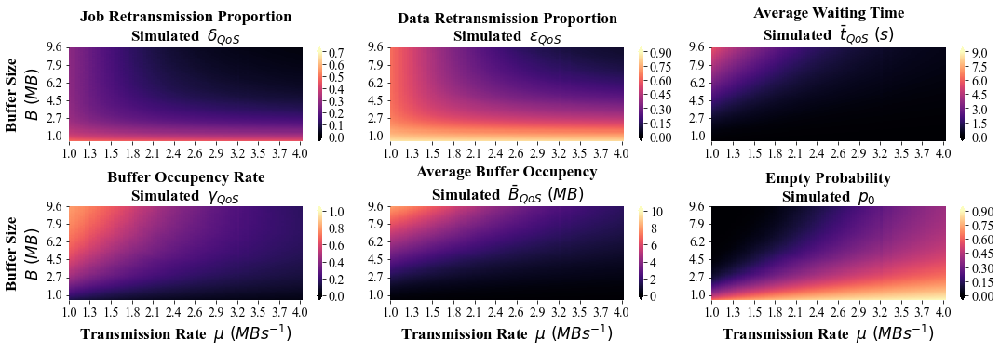

In [147]:
## Plot loss changes
fig, axes = plt.subplots( 2 , 3 , figsize=( 18, 5 ) )
title_fontsize = 17
tick_size = 14
leg_size = 17

data_lst = [[deltas, epsilons, ts],
            [occupancyRates, B_bar, emptyProbabilities]]

title = [['Job Retransmission Proportion\nSimulated  $\delta_{QoS}$', 
          'Data Retransmission Proportion\nSimulated  $\epsilon_{QoS}$', 
          'Average Waiting Time\nSimulated  $\\bar{t}_{QoS}\ (s)$'],
         ['Buffer Occupency Rate\nSimulated  $\gamma_{QoS}$', 
          'Average Buffer Occupency\nSimulated  $\\bar{B}_{QoS}\ (MB)$', 
          'Empty Probability\nSimulated  $p_{0}$']]

colorbar_nbins = [[7,  8,  7],
                  [5, 5, 7]]

colorbar_vmax  = [[0.7, 0.9, 9],
                  [1.0, 10, 0.9]]

for i in range(2):
    for j in range(3):
        hp = sns.heatmap(np.flipud(data_lst[i][j]), ax=axes[i,j], vmin=0.0, vmax=colorbar_vmax[i][j], cmap='magma', # 'magma'
                         cbar_kws={'orientation': 'vertical', 'extend': 'both'})
        colorbar = hp.collections[0].colorbar
        colorbar.ax.tick_params(labelsize=tick_size)
        colorbar.ax.yaxis.set_major_locator(MaxNLocator(nbins=colorbar_nbins[i][j]))
        
        axes[i,j].set_xticks(np.arange(0, 100, 9))
        axes[i,j].set_xticklabels(np.round(mu[0],1)[::9])
        axes[i,j].tick_params(axis='x', labelsize=tick_size)
        
        axes[i,j].set_yticks(np.arange(0, 100, 19))
        axes[i,j].set_yticklabels(np.round(B[:,0],1)[::19][::-1])
        axes[i,j].tick_params(axis='y', labelsize=tick_size)
        axes[i,j].set_yticklabels(axes[i,j].get_yticklabels(), rotation=0)
        
        axes[i,j].set_title(title[i][j], fontsize=title_fontsize, fontweight='bold')
        
        if i == 1:
            axes[i,j].set_xlabel('Transmission Rate  $\mu\ (MBs^{-1})$', fontsize=title_fontsize, fontweight='bold') 
        if j == 0:
            axes[i,j].set_ylabel('Buffer Size\n$B\ (MB)$', fontsize=title_fontsize, fontweight='bold')
        
plt.subplots_adjust(wspace=0.1, hspace=0.7)
plt.show()

# Analytical Result
## Partially Rejected
### Distribution

In [221]:
# mu > data arrival rate = 2.6 bytes / sec
p = np.array([0.3,0.5,0.2]) ; a_size = np.array([0.5,1.5,2]) ; size_dist_para = ( p , 1/a_size )
lamb = 2
mu1 = 2
mu2 = 3

Bs = np.linspace(1, 10, 10)
ys = []
p1s = [[],[]]
p0s = [[],[]]

for B in Bs :
    model1 = BufferSize(size_dist_para, mu1, lamb, B)
    model2 = BufferSize(size_dist_para, mu2, lamb, B)
    
    model1.fit_PR()
    model2.fit_PR()
    
    y = np.linspace(0, B, 100)
    ys.append(y)
    
    p1s[0].append(model1.p1(y))
    p0s[0].append(model1.p0)
    p1s[1].append(model2.p1(y))
    p0s[1].append(model2.p0)

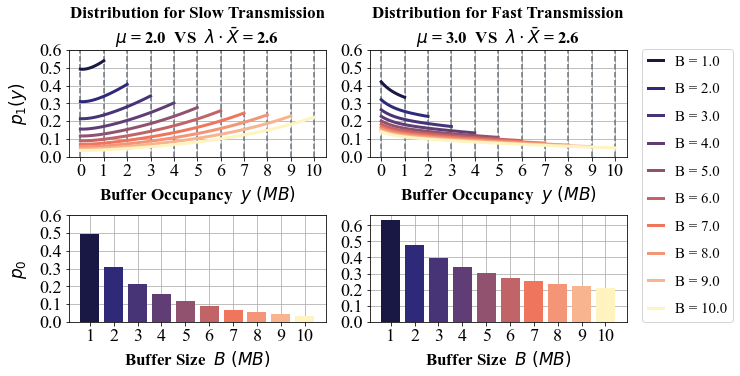

In [354]:
## Plot result
title_fontsize = 17
tick_size = 18
leg_size = 15
colors = ['#191743','#2e2a79','#473477','#603e75','#915270','#c06467','#ef755d','#f39576','#f7b48f','#fff3c0']
fig, ax = plt.subplots(2,2, figsize=( 10, 5 ))

for j in range(2):
    
    ax[0,j].axvline(x=0, color='#6c757d', linestyle='--')

    for k in range(len(ys)):
        ax[0,j].axvline(x=Bs[k], color='#6c757d', linestyle='--')
        ax[0,j].plot( ys[k] , p1s[j][k], label='B = %.1f'%(Bs[k]), linewidth=3, color=colors[k] )    
    ax[1,j].bar(Bs, p0s[j], color=colors)
    
    if j == 0:
        ax[0,j].set_title('Distribution for Slow Transmission\n$\mu$ = %.1f  VS  $\lambda\cdot \\bar{X}$ = 2.6'%mu1, fontsize=title_fontsize, fontweight='bold')
    else:
        ax[0,j].set_title('Distribution for Fast Transmission\n$\mu$ = %.1f  VS  $\lambda\cdot \\bar{X}$ = 2.6'%mu2, fontsize=title_fontsize, fontweight='bold') 
    
    for i in range(2):
        if i == 0 :
            ax[i,j].set_xticks(np.linspace(0,10,11)) 
            ax[i,j].set_yticks(np.linspace(0,0.6,7)) 
            ax[i,j].set_xlabel('Buffer Occupancy  $y\ (MB)$', fontsize=title_fontsize, fontweight='bold')
            if j == 0:
                ax[i,j].set_ylabel('$p_1(y)$', fontsize=title_fontsize, fontweight='bold', labelpad=10) 

        else:
            ax[i,j].set_xticks(Bs)
            ax[i,j].set_yticks(np.linspace(0,0.6,7))
            ax[i,j].set_xticklabels([str(int(val)) for val in Bs])
            ax[i,j].set_xlabel('Buffer Size  $B\ (MB)$', fontsize=title_fontsize, fontweight='bold')
            if j == 0:
                ax[i,j].set_ylabel('$p_0$', fontsize=title_fontsize, fontweight='bold', labelpad=10) 
            
        ax[i,j].tick_params(axis='x', labelsize=tick_size)
        ax[i,j].tick_params(axis='y', labelsize=tick_size) 
        ax[i,j].grid()
        ax[i,j].set_axisbelow(True)
        
legend = ax[0,0].legend(loc='center left', bbox_to_anchor=(2.2, -0.27), fontsize=leg_size, handlelength=1.0, labelspacing=0.9)
plt.subplots_adjust(wspace=0.17, hspace=0.55)
plt.show()

### QoS

In [148]:
lamb = 2
p = np.array([0.3,0.5,0.2]) ; a_size = np.array([0.5,1.5,2]) ; size_dist_para = ( p , 1/a_size )

mu = np.linspace(1,4, 100)
B  = np.linspace(1, 10, 100)
mu, B = np.meshgrid(mu, B)

occupancyRates = np.empty_like(mu)
emptyProbabilities = np.empty_like(mu)
deltas = np.empty_like(mu)     # job retransmission proportion
epsilons = np.empty_like(mu)   # data retransmission proportion
ts = np.empty_like(mu)         # average wait time
    
for i in tqdm(range(mu.shape[0])):
    for j in range(mu.shape[1]):
        model = BufferSize(size_dist_para, mu[i, j], lamb, B[i, j])
        model.fit_PR()
        occupancyRates[i,j] = model.occupancyRate
        emptyProbabilities[i,j] = model.p0
        deltas[i,j] = model.delta_QoS
        epsilons[i,j] = model.epsilon_QoS
        ts[i,j] = model.t_QoS

B_bar = occupancyRates * B

  0%|          | 0/100 [00:00<?, ?it/s]

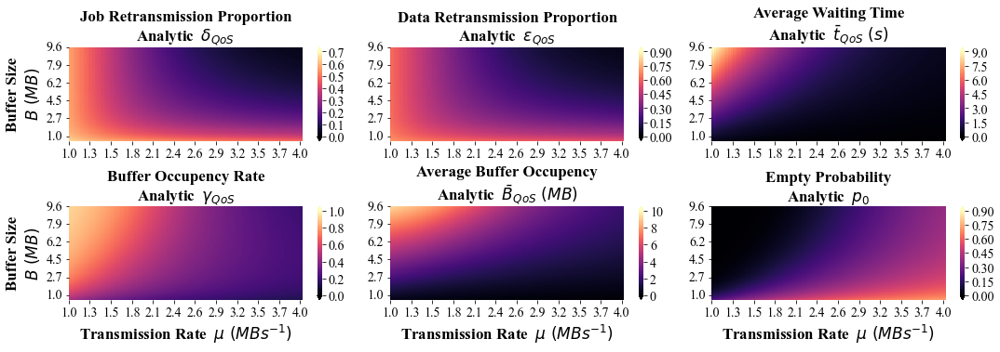

In [150]:
## Plot loss changes
fig, axes = plt.subplots( 2 , 3 , figsize=( 18, 5 ) )
title_fontsize = 17
tick_size = 14
leg_size = 17

data_lst = [[deltas, epsilons, ts],
            [occupancyRates, B_bar, emptyProbabilities]]

title = [['Job Retransmission Proportion\nAnalytic  $\delta_{QoS}$', 
          'Data Retransmission Proportion\nAnalytic  $\epsilon_{QoS}$', 
          'Average Waiting Time\nAnalytic  $\\bar{t}_{QoS}\ (s)$'],
         ['Buffer Occupency Rate\nAnalytic  $\gamma_{QoS}$', 
          'Average Buffer Occupency\nAnalytic  $\\bar{B}_{QoS}\ (MB)$', 
          'Empty Probability\nAnalytic  $p_{0}$']]

colorbar_nbins = [[7,  8,  7],
                  [5, 5, 7]]

colorbar_vmax  = [[0.7, 0.9, 9],
                  [1.0, 10, 0.9]]

for i in range(2):
    for j in range(3):
        hp = sns.heatmap(np.flipud(data_lst[i][j]), ax=axes[i,j], vmin=0.0, vmax=colorbar_vmax[i][j], cmap='magma', # 'magma'
                         cbar_kws={'orientation': 'vertical', 'extend': 'both'})
        colorbar = hp.collections[0].colorbar
        colorbar.ax.tick_params(labelsize=tick_size)
        colorbar.ax.yaxis.set_major_locator(MaxNLocator(nbins=colorbar_nbins[i][j]))
        
        axes[i,j].set_xticks(np.arange(0, 100, 9))
        axes[i,j].set_xticklabels(np.round(mu[0],1)[::9])
        axes[i,j].tick_params(axis='x', labelsize=tick_size)
        
        axes[i,j].set_yticks(np.arange(0, 100, 19))
        axes[i,j].set_yticklabels(np.round(B[:,0],1)[::19][::-1])
        axes[i,j].tick_params(axis='y', labelsize=tick_size)
        axes[i,j].set_yticklabels(axes[i,j].get_yticklabels(), rotation=0)
        
        axes[i,j].set_title(title[i][j], fontsize=title_fontsize, fontweight='bold')
        
        if i == 1:
            axes[i,j].set_xlabel('Transmission Rate  $\mu\ (MBs^{-1})$', fontsize=title_fontsize, fontweight='bold') 
        if j == 0:
            axes[i,j].set_ylabel('Buffer Size\n$B\ (MB)$', fontsize=title_fontsize, fontweight='bold')
        
plt.subplots_adjust(wspace=0.1, hspace=0.7)
plt.show()

### Compare with Simulation

In [151]:
# Read simu data
data_simu = Readpickle('./data/simul_result_5000_PARTIAL.pkl')

deltas_simu = data_simu['deltas']
epsilons_simu = data_simu['epsilons']
ts_simu = data_simu['ts']
occupancyRates_simu = data_simu['occupancyRates']
B_bar_simu = occupancyRates_simu * B
emptyProbabilities_simu = data_simu['emptyProbabilities']

error_lst = [[deltas_simu-deltas, epsilons_simu-epsilons, ts_simu-ts],
             [occupancyRates_simu-occupancyRates, B_bar_simu-B_bar, emptyProbabilities_simu-emptyProbabilities]]
rela_error_lst = [[(deltas_simu-deltas)/deltas_simu, 
                   (epsilons_simu-epsilons)/epsilons_simu, 
                   (ts_simu-ts)/ts_simu],
             [(occupancyRates_simu-occupancyRates)/occupancyRates_simu, 
              (B_bar_simu-B_bar)/B_bar_simu, 
              (emptyProbabilities_simu-emptyProbabilities)/emptyProbabilities_simu]]

log_abs_error_lst = [[np.log10(np.abs(error)) for error in row] for row in error_lst]
log_abs_rela_error_lst = [[np.log10(np.abs(error)) for error in row] for row in rela_error_lst]

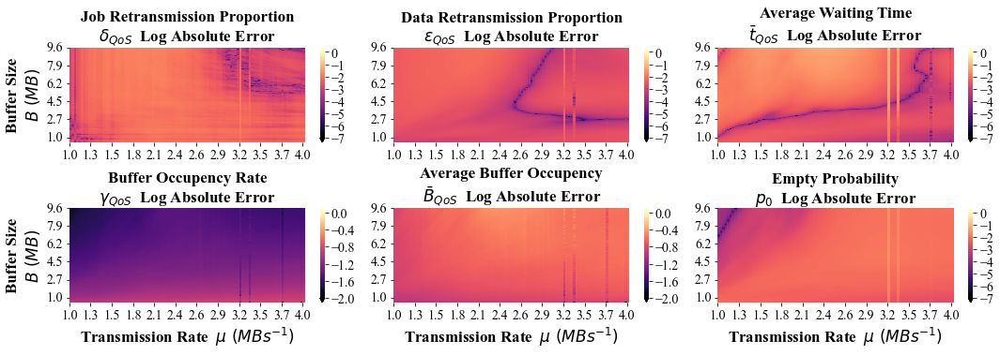

In [152]:
## Plot loss changes
fig, axes = plt.subplots( 2 , 3 , figsize=( 18, 5 ) )
title_fontsize = 17
tick_size = 14
leg_size = 17

data_lst = [[deltas, epsilons, ts],
            [occupancyRates, B_bar, emptyProbabilities]]

title = [['Job Retransmission Proportion\n$\delta_{QoS}$  Log Absolute Error', 
          'Data Retransmission Proportion\n$\epsilon_{QoS}$  Log Absolute Error', 
          'Average Waiting Time\n$\\bar{t}_{QoS}$  Log Absolute Error'],
         ['Buffer Occupency Rate\n$\gamma_{QoS}$  Log Absolute Error', 
          'Average Buffer Occupency\n$\\bar{B}_{QoS}$  Log Absolute Error', 
          'Empty Probability\n$p_{0}$  Log Absolute Error']]

colorbar_nbins = [[7, 7, 7],
                  [5, 5, 7]]

colorbar_vmin  = [[-7, -7, -7],
                  [-2, -2, -7]]

for i in range(2):
    for j in range(3):
        hp = sns.heatmap(np.flipud(log_abs_error_lst[i][j]), ax=axes[i,j], vmax=0.0, vmin=colorbar_vmin[i][j], cmap='magma', # 'magma'
                         cbar_kws={'orientation': 'vertical', 'extend': 'both'})
        colorbar = hp.collections[0].colorbar
        colorbar.ax.tick_params(labelsize=tick_size)
        colorbar.ax.yaxis.set_major_locator(MaxNLocator(nbins=colorbar_nbins[i][j]))
        
        axes[i,j].set_xticks(np.arange(0, 100, 9))
        axes[i,j].set_xticklabels(np.round(mu[0],1)[::9])
        axes[i,j].tick_params(axis='x', labelsize=tick_size)
        
        axes[i,j].set_yticks(np.arange(0, 100, 19))
        axes[i,j].set_yticklabels(np.round(B[:,0],1)[::19][::-1])
        axes[i,j].tick_params(axis='y', labelsize=tick_size)
        axes[i,j].set_yticklabels(axes[i,j].get_yticklabels(), rotation=0)
        
        axes[i,j].set_title(title[i][j], fontsize=title_fontsize, fontweight='bold')
        
        if i == 1:
            axes[i,j].set_xlabel('Transmission Rate  $\mu\ (MBs^{-1})$', fontsize=title_fontsize, fontweight='bold') 
        if j == 0:
            axes[i,j].set_ylabel('Buffer Size\n$B\ (MB)$', fontsize=title_fontsize, fontweight='bold')
        
plt.subplots_adjust(wspace=0.1, hspace=0.7)
plt.show()

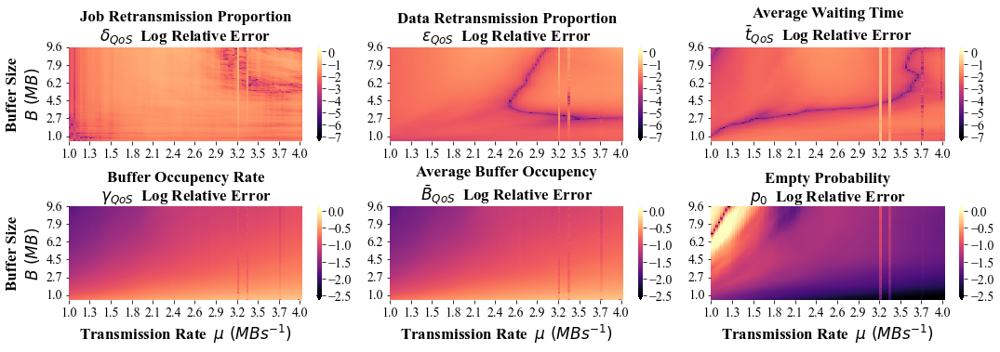

In [153]:
## Plot loss changes
fig, axes = plt.subplots( 2 , 3 , figsize=( 18, 5 ) )
title_fontsize = 17
tick_size = 14
leg_size = 17

data_lst = [[deltas, epsilons, ts],
            [occupancyRates, B_bar, emptyProbabilities]]

title = [['Job Retransmission Proportion\n$\delta_{QoS}$  Log Relative Error', 
          'Data Retransmission Proportion\n$\epsilon_{QoS}$  Log Relative Error', 
          'Average Waiting Time\n$\\bar{t}_{QoS}$  Log Relative Error'],
         ['Buffer Occupency Rate\n$\gamma_{QoS}$  Log Relative Error', 
          'Average Buffer Occupency\n$\\bar{B}_{QoS}$  Log Relative Error', 
          'Empty Probability\n$p_{0}$  Log Relative Error']]

colorbar_nbins = [[7, 7, 7],
                  [5, 5, 5]]

colorbar_vmin  = [[-7, -7, -7],
                  [-2.5, -2.5, -2.5]]

for i in range(2):
    for j in range(3):
        hp = sns.heatmap(np.flipud(log_abs_rela_error_lst[i][j]), ax=axes[i,j], vmax=0.0, vmin=colorbar_vmin[i][j], cmap='magma', # 'magma'
                         cbar_kws={'orientation': 'vertical', 'extend': 'both'})
        colorbar = hp.collections[0].colorbar
        colorbar.ax.tick_params(labelsize=tick_size)
        colorbar.ax.yaxis.set_major_locator(MaxNLocator(nbins=colorbar_nbins[i][j]))
        
        axes[i,j].set_xticks(np.arange(0, 100, 9))
        axes[i,j].set_xticklabels(np.round(mu[0],1)[::9])
        axes[i,j].tick_params(axis='x', labelsize=tick_size)
        
        axes[i,j].set_yticks(np.arange(0, 100, 19))
        axes[i,j].set_yticklabels(np.round(B[:,0],1)[::19][::-1])
        axes[i,j].tick_params(axis='y', labelsize=tick_size)
        axes[i,j].set_yticklabels(axes[i,j].get_yticklabels(), rotation=0)
        
        axes[i,j].set_title(title[i][j], fontsize=title_fontsize, fontweight='bold')
        
        if i == 1:
            axes[i,j].set_xlabel('Transmission Rate  $\mu\ (MBs^{-1})$', fontsize=title_fontsize, fontweight='bold') 
        if j == 0:
            axes[i,j].set_ylabel('Buffer Size\n$B\ (MB)$', fontsize=title_fontsize, fontweight='bold')
        
plt.subplots_adjust(wspace=0.1, hspace=0.7)
plt.show()

## Fully Rejected
### Distribution

In [423]:
p = np.array([0.3,0.5,0.2]) ; a_size = np.array([0.5,1.5,2]) ; 
size_dist_para = ( p , 1/a_size )
job_size_generator = JobSizeGenerator(p , 1/a_size)
Bs = np.linspace(1, 10, 10)
lamb = 2 ; mu1 = 2 ; mu2 = 3
mu = [mu1, mu2]

ys = []
p1s = [[],[]]
p0s = [[],[]]
p0_simu = [[],[]]


for buffer_size in tqdm(Bs) :
    for i in range(2) :
        solver = FixedPointSolver(mu=mu[i],
                 param_lambda=lamb,
                 buffer_size=buffer_size,
                 F_c=job_size_generator.complementary_cdf,
                 n_grid_points=200,
                 n_iter=1000)
        solver.solve()
        p_0, p_1 = solver.compute_probabilities()
        
        sim = Simulation( end_time = 5000,
                  job_arrival_rate = lamb, 
                  p_values = size_dist_para[0],
                  a_values = size_dist_para[1],
                  buffer_size = buffer_size,
                  mus = [mu[i]],
                  rejection_mode = RejectionModes.FULL)
        sim.run_compute()
        
        p0s[i].append(p_0)
        p1s[i].append(p_1)
        p0_simu[i].append(sim.p0)
        
    ys.append(solver.grid)

  0%|          | 0/10 [00:00<?, ?it/s]

In [ ]:
np.random.seed(30)
end_time = 5000
p = np.array([0.3,0.5,0.2])
a_size = np.array([0.5,1.5,2])
a = 1/a_size
size_dist_para = (p,a)

mu = [3]
lamb = 2
B = 1

rejection_mode = RejectionModes.FULL

sim = Simulation( end_time = 5000,
                  job_arrival_rate = lamb, 
                  p_values = size_dist_para[0],
                  a_values = size_dist_para[1],
                  buffer_size = buffer_size,
                  mus = mu[i],
                  rejection_mode = RejectionModes.FULL)
sim.run_compute()
sim.display_result()

plt.plot(sim.event_times[:100], sim.event_buff_occupancies[:100])
plt.show()

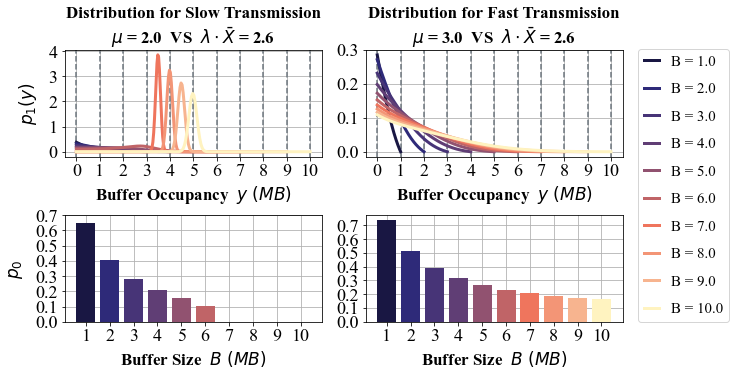

In [430]:
## Plot result
title_fontsize = 17
tick_size = 18
leg_size = 15
colors = ['#191743','#2e2a79','#473477','#603e75','#915270','#c06467','#ef755d','#f39576','#f7b48f','#fff3c0']
fig, ax = plt.subplots(2,2, figsize=( 10, 5 ))

for j in range(2):
    
    ax[0,j].axvline(x=0, color='#6c757d', linestyle='--')

    for k in range(len(ys)):
        ax[0,j].axvline(x=Bs[k], color='#6c757d', linestyle='--')
        ax[0,j].plot( ys[k] , p1s[j][k], label='B = %.1f'%(Bs[k]), linewidth=3, color=colors[k] )    
        
    ax[1,j].bar(Bs, p0s[j], color=colors)
    
    if j == 0:
        ax[0,j].set_title('Distribution for Slow Transmission\n$\mu$ = %.1f  VS  $\lambda\cdot \\bar{X}$ = 2.6'%mu1, fontsize=title_fontsize, fontweight='bold')
    else:
        ax[0,j].set_title('Distribution for Fast Transmission\n$\mu$ = %.1f  VS  $\lambda\cdot \\bar{X}$ = 2.6'%mu2, fontsize=title_fontsize, fontweight='bold') 
    
    for i in range(2):
        if i == 0 :
            ax[i,j].set_xticks(np.linspace(0,10,11)) 
            if j == 1:
                ax[i,j].set_yticks(np.linspace(0,0.3,4)) 
            else:
                ax[i,j].set_yticks(np.linspace(0,4,5))
                
            ax[i,j].set_xlabel('Buffer Occupancy  $y\ (MB)$', fontsize=title_fontsize, fontweight='bold')
            if j == 0:
                ax[i,j].set_ylabel('$p_1(y)$', fontsize=title_fontsize, fontweight='bold', labelpad=10) 

        else:
            ax[i,j].set_xticks(Bs)
            ax[i,j].set_yticks(np.linspace(0,0.7,8))
            ax[i,j].set_xticklabels([str(int(val)) for val in Bs])
            ax[i,j].set_xlabel('Buffer Size  $B\ (MB)$', fontsize=title_fontsize, fontweight='bold')
            if j == 0:
                ax[i,j].set_ylabel('$p_0$', fontsize=title_fontsize, fontweight='bold', labelpad=10) 
            
        ax[i,j].tick_params(axis='x', labelsize=tick_size)
        ax[i,j].tick_params(axis='y', labelsize=tick_size) 
        ax[i,j].grid()
        ax[i,j].set_axisbelow(True)
        
legend = ax[0,0].legend(loc='center left', bbox_to_anchor=(2.2, -0.27), fontsize=leg_size, handlelength=1.0, labelspacing=0.9)
plt.subplots_adjust(wspace=0.17, hspace=0.55)
plt.show()

## Multiple Servers
### Data Sampling

In [524]:
# Parameter Settings
paras = {
                'exp_num'       : (1.0, 5),
                'job_size'      : (0.1, 5),
                'lambda'        : (0.1, 5),
                'server_num'    : (1, 10),
                'mu'            : np.arange(1, 6),
                'buffer_size'   : np.arange(1,11)
            }

recover_y_dim = (len(paras['buffer_size']), len(paras['mu']))

In [529]:
x = []         # [ [a, 0, p, 0, lambda, server_num] ]  5 + 5 + 2 = 12
y_delta   = [] # [ flatten((u,B))]
y_epsilon = [] 
y_t_bar   = []  
y_gamma    = []

sample_num = 5000
mu, buffersize = np.meshgrid(paras['mu'], paras['buffer_size'])

for i in tqdm(range(sample_num)):
    
    # Sample job parameters
    a , p = np.zeros(paras['exp_num'][1]) , np.zeros(paras['exp_num'][1])
    exponential_num = np.random.randint(paras['exp_num'][0], paras['exp_num'][1])
    a[:exponential_num] = 1/np.random.uniform(paras['job_size'][0], paras['job_size'][1], exponential_num)
    p[:exponential_num] = np.random.dirichlet(np.ones(exponential_num)).flatten()
    job_arrival_rate = np.random.uniform(paras['lambda'][0], paras['lambda'][1])
    server_num = np.random.randint(paras['server_num'][0], paras['server_num'][1])
    
    delta   = np.zeros(recover_y_dim)
    epsilon = np.zeros(recover_y_dim)
    t_bar   = np.zeros(recover_y_dim)
    gamma    = np.zeros(recover_y_dim)
    
    for i in range(mu.shape[0]):
        for j in range(buffersize.shape[1]):
            sim = Simulation( end_time = 250,
                      job_arrival_rate = job_arrival_rate, 
                      p_values = p[:exponential_num],
                      a_values = a[:exponential_num],
                      buffer_size = buffersize[i,j],
                      mus = mu[i,j] * np.ones(server_num),
                      rejection_mode = RejectionModes.PARTIAL)
                
            sim.run()
            sim.compute_qos()
                
            delta[i,j]   = sim.qos_delta
            epsilon[i,j] = sim.qos_epsilon
            t_bar[i,j]   = sim.qos_t_bar
            gamma[i,j]    = sim.qos_B_bar_normalized
    
    x.append(np.concatenate((a,p,[job_arrival_rate,server_num])))
    y_delta.append(delta.flatten())
    y_epsilon.append(epsilon.flatten())
    y_t_bar.append(t_bar.flatten())
    y_gamma.append(gamma.flatten())

y_lst = [y_delta, y_epsilon, y_t_bar, y_gamma]
y_lst_normalized = y_lst.copy()

  0%|          | 0/5000 [00:00<?, ?it/s]

In [749]:
# Normalized X := (2*X-Sigma)*Lambda matrix multiplication
# torch.matmul((2 * dataset.tensors[0] - Sigma), Lambda)
import torch
from torch.utils.data import TensorDataset, random_split

x_upperbound = np.concatenate(((1/paras['job_size'][0]) * np.ones(paras['exp_num'][1]),
                np.ones(paras['exp_num'][1]),
                np.array([paras['lambda'][1],paras['server_num'][1]])))

x_lowerbound = np.concatenate(((1/paras['job_size'][1]) * np.ones(paras['exp_num'][1]),
                np.zeros(round(paras['exp_num'][1])),
                np.array([paras['lambda'][0],paras['server_num'][0]])))

columns  = [(x_upperbound[i] + x_lowerbound[i]) for i in range(len(x_upperbound))]
diagnals = [1/(x_upperbound[i] - x_lowerbound[i]) for i in range(len(x_upperbound))]
t_bar_upperbound = buffersize.flatten() / mu.flatten()

Sigma  = torch.tensor(columns)
Lambda = torch.diag(torch.tensor(diagnals))

# To tensor and construct dataloader
x = np.array(x)
y_lst = [np.array(y) for y in y_lst]

x_tensor = torch.tensor(x, dtype=torch.float32)
x_tensor = torch.matmul((2 * x_tensor - Sigma), Lambda)
x_tensor = x_tensor.to(torch.float32)
y_tensor_lst = [torch.tensor(y, dtype=torch.float32) for y in y_lst]
datasets  = [TensorDataset(x_tensor, y_tensor) for y_tensor in y_tensor_lst]

# Dataset sizes
total_size = len(datasets[0])
train_size = int(total_size * 0.6)
validate_size = int(total_size * 0.2)
test_size  = total_size - train_size - validate_size

# Construct datasets
split_data_sets = []
for data_set in datasets:
    train, validate, test = random_split(data_set, [train_size, validate_size, test_size])
    split_data_sets.append({'train'    : train,
                            'validate' : validate,
                            'test'     : test})


In [765]:
# Save data
data_saved = {
    'paras'            : paras,   
    'grid'             : (mu, buffersize),
    'x'                : x,                 # origin data
    'y_lst'            : y_lst,             # [y_delta, y_epsilon, y_t_bar, y_gamma]
    'y_lst_normalized' : y_lst_normalized,
    'datasets'         : datasets,          # dataset.tensors gives (x_tensor, y_tensor)
    'split_data_sets'  : split_data_sets,   # train[:] gives (x_tensor, y_tensor) in train
    'x_norm_mat'       : (Sigma, Lambda),
    'recover_y_dim'    : recover_y_dim,
    't_bar_upperbound' : t_bar_upperbound
}

# Savepickle(data_saved, doc_path='./data/multiserver_learning_data.pkl')

### Network Training

In [2]:
# Read data
from torch.utils.data import DataLoader
from src.GridbasedNet import GridbasedFNN

data_saved = Readpickle('./data/multiserver_learning_data.pkl')
paras   = data_saved['paras']
mu, buffersize = data_saved['grid']

datasets = data_saved['datasets']                  
split_data_sets = data_saved['split_data_sets'] # [y_delta, y_epsilon, y_t_bar, y_gamma]

Sigma , Lambda = data_saved['x_norm_mat']
recover_y_dim = data_saved['recover_y_dim']
t_bar_upperbound = data_saved['t_bar_upperbound']

loaders = []
for split_data_set in split_data_sets :
    loader = { 'train' : DataLoader(split_data_set['train'], batch_size=128, shuffle=True),
               'validate': DataLoader(split_data_set['validate'], batch_size=128, shuffle=True),
               'test'  : DataLoader(split_data_set['test'],  batch_size=128, shuffle=True) }
    loaders.append(loader)

In [777]:
# Train the model to predict delta
delta_approximator = GridbasedFNN(loaders[0], drop=0.1)
delta_approximator.Train(num_epochs=5000, learning_rate=0.001, lr_step_size=100, min_lr =5e-4, abs_tolerance=0.001)
delta_approximator.Test(loaders[0]['test'])

------------------------------------------------------- 
-------------------- Epoch [1/5000] -------------------- 
Epoch [1/5000], Step [1/24], Loss: 476.9857
Epoch [1/5000], Step [5/24], Loss: 460.7454
Epoch [1/5000], Step [10/24], Loss: 402.0558
Epoch [1/5000], Step [15/24], Loss: 446.4241
Epoch [1/5000], Step [20/24], Loss: 398.9431
Epoch [1/5000], Avg. Train Loss: 427.8486, Avg. Validate Loss: 329.0730
------------------------------------------------------- 
-------------------- Epoch [2/5000] -------------------- 
Epoch [2/5000], Step [1/24], Loss: 352.1428
Epoch [2/5000], Step [5/24], Loss: 292.9227
Epoch [2/5000], Step [10/24], Loss: 297.7534
Epoch [2/5000], Step [15/24], Loss: 307.7056
Epoch [2/5000], Step [20/24], Loss: 213.4265
Epoch [2/5000], Avg. Train Loss: 284.1580, Avg. Validate Loss: 250.1923
------------------------------------------------------- 
-------------------- Epoch [3/5000] -------------------- 
Epoch [3/5000], Step [1/24], Loss: 253.7979
Epoch [3/5000], Step 

(0.08818058586120606, 11.022573232650757)

In [769]:
# Train the model to predict epsilon
epsilon_approximator = GridbasedFNN(loaders[1], drop=0.1)
epsilon_approximator.Train(num_epochs=5000, learning_rate=0.001, lr_step_size=100, min_lr =5e-4, abs_tolerance=0.001)
epsilon_approximator.Test(loaders[1]['test'])

------------------------------------------------------- 
-------------------- Epoch [1/5000] -------------------- 
Epoch [1/5000], Step [1/24], Loss: 432.3696
Epoch [1/5000], Step [5/24], Loss: 410.1255
Epoch [1/5000], Step [10/24], Loss: 438.6922
Epoch [1/5000], Step [15/24], Loss: 411.5596
Epoch [1/5000], Step [20/24], Loss: 366.0897
Epoch [1/5000], Avg. Train Loss: 392.0855, Avg. Validate Loss: 299.9043
------------------------------------------------------- 
-------------------- Epoch [2/5000] -------------------- 
Epoch [2/5000], Step [1/24], Loss: 359.9104
Epoch [2/5000], Step [5/24], Loss: 306.6417
Epoch [2/5000], Step [10/24], Loss: 283.4955
Epoch [2/5000], Step [15/24], Loss: 247.6208
Epoch [2/5000], Step [20/24], Loss: 253.7903
Epoch [2/5000], Avg. Train Loss: 271.0896, Avg. Validate Loss: 231.7232
------------------------------------------------------- 
-------------------- Epoch [3/5000] -------------------- 
Epoch [3/5000], Step [1/24], Loss: 279.9123
Epoch [3/5000], Step 

(0.08697985458374023, 10.87248182296753)

In [764]:
# Train the model to predict t_bar
t_bar_approximator = GridbasedFNN(loaders[2], output_activation='ReLU', drop=0.3)
t_bar_approximator.Train(num_epochs=5000, learning_rate=0.001, lr_step_size=1000, min_lr =5e-4, abs_tolerance=0.001)
t_bar_approximator.Test(loaders[2]['test'])

------------------------------------------------------- 
-------------------- Epoch [1/5000] -------------------- 
Epoch [1/5000], Step [1/24], Loss: 4845.9443
Epoch [1/5000], Step [5/24], Loss: 5743.0977
Epoch [1/5000], Step [10/24], Loss: 5329.3726
Epoch [1/5000], Step [15/24], Loss: 6312.7427
Epoch [1/5000], Step [20/24], Loss: 4911.8438
Epoch [1/5000], Avg. Train Loss: 5478.5103, Avg. Validate Loss: 4429.7186
------------------------------------------------------- 
-------------------- Epoch [2/5000] -------------------- 
Epoch [2/5000], Step [1/24], Loss: 5343.7373
Epoch [2/5000], Step [5/24], Loss: 5249.0669
Epoch [2/5000], Step [10/24], Loss: 5001.7144
Epoch [2/5000], Step [15/24], Loss: 3539.7854
Epoch [2/5000], Step [20/24], Loss: 4267.5337
Epoch [2/5000], Avg. Train Loss: 4708.7241, Avg. Validate Loss: 3944.1378
------------------------------------------------------- 
-------------------- Epoch [3/5000] -------------------- 
Epoch [3/5000], Step [1/24], Loss: 3302.7144
Epoch 

(0.38730295753479005, 48.412869691848755)

In [783]:
# Train the model to predict gamma
gamma_approximator = GridbasedFNN(loaders[3], drop=0.1)
gamma_approximator.Train(num_epochs=5000, learning_rate=0.001, lr_step_size=100, min_lr =5e-4, abs_tolerance=0.001)
gamma_approximator.Test(loaders[3]['test'])

------------------------------------------------------- 
-------------------- Epoch [1/5000] -------------------- 
Epoch [1/5000], Step [1/24], Loss: 324.4940
Epoch [1/5000], Step [5/24], Loss: 272.5768
Epoch [1/5000], Step [10/24], Loss: 262.0550
Epoch [1/5000], Step [15/24], Loss: 208.1112
Epoch [1/5000], Step [20/24], Loss: 237.9754
Epoch [1/5000], Avg. Train Loss: 256.4335, Avg. Validate Loss: 221.7151
------------------------------------------------------- 
-------------------- Epoch [2/5000] -------------------- 
Epoch [2/5000], Step [1/24], Loss: 209.7270
Epoch [2/5000], Step [5/24], Loss: 194.6384
Epoch [2/5000], Step [10/24], Loss: 253.8588
Epoch [2/5000], Step [15/24], Loss: 163.5435
Epoch [2/5000], Step [20/24], Loss: 204.6722
Epoch [2/5000], Avg. Train Loss: 198.2909, Avg. Validate Loss: 186.7281
------------------------------------------------------- 
-------------------- Epoch [3/5000] -------------------- 
Epoch [3/5000], Step [1/24], Loss: 187.8599
Epoch [3/5000], Step 

(0.043502477169036866, 5.437809646129608)

In [796]:
import dill
def SaveModel(obj, doc_path):
  with open(doc_path, 'wb') as file:
         dill.dump(obj, file)     

approximators  = [delta_approximator, epsilon_approximator, t_bar_approximator, gamma_approximator]
approximator_name  = ['delta_approximator', 'epsilon_approximator', 't_bar_approximator', 'gamma_approximator']

In [797]:
# save models
# for i in range(4):
#     approximator = approximators[i]
#     result_saved = {
#     'state_dict' : approximator.state_dict(),
#     'train_loss' : approximator.train_loss,
#     'validate_loss' : approximator.validate_loss}
#     SaveModel(result_saved, './data/multiserver_%s.pkl'%(approximator_name[i]))

### Analysis

In [135]:
import dill
import torch

def ReadModel(doc_path):
    with open(doc_path, 'rb') as file:
        return dill.load(file)

In [136]:
# Data set
data_saved = Readpickle('./data/multiserver_learning_data.pkl')
paras   = data_saved['paras']
mu, buffersize = data_saved['grid']

datasets = data_saved['datasets']                  
split_data_sets = data_saved['split_data_sets'] # [y_delta, y_epsilon, y_t_bar, y_gamma]

Sigma , Lambda = data_saved['x_norm_mat']
recover_y_dim = data_saved['recover_y_dim']
t_bar_upperbound = data_saved['t_bar_upperbound']

# Read model
approximator_name  = ['delta_approximator', 'epsilon_approximator', 't_bar_approximator', 'gamma_approximator']
approximators  = [GridbasedFNN([]), GridbasedFNN([]), GridbasedFNN([], output_activation='ReLU'), GridbasedFNN([])]

for i in range(4):
    result_saved = ReadModel('./data/multiserver_%s.pkl'%(approximator_name[i]))
    approximators[i].load_state_dict(result_saved['state_dict'])
    approximators[i].train_loss = result_saved['train_loss']
    approximators[i].validate_loss = result_saved['validate_loss']


In [137]:
def predict(model, x):
    model.eval()
    with torch.no_grad():
        x = torch.tensor(x, dtype=torch.float32).unsqueeze(0)
        x = torch.matmul((2 * x - Sigma), Lambda)
        x = x.to(torch.float32)
        y_hat = model.forward(x).squeeze().numpy()
    return y_hat

data_lst = [[],[],[],[]]

for i in range(4) :
    for n in range(1,6):
        y_hat = predict(approximators[i], 
                        [1/0.5,1/1.5,1/2,0,0,0.3,0.5,0.2,0,0,2,n]).reshape(recover_y_dim)
        data_lst[i].append(y_hat)

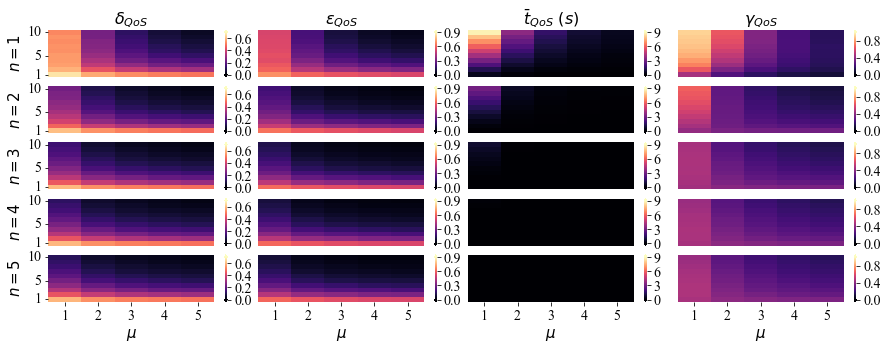

In [138]:
## Plot loss changes
import seaborn as sns
from matplotlib.ticker import MaxNLocator

fig, axes = plt.subplots( 5 , 4 , figsize=( 15, 5 ) )
title_fontsize = 15
tick_size = 14
leg_size = 17

title = ['$\delta_{QoS}$', 
         '$\epsilon_{QoS}$', 
         '$\\bar{t}_{QoS}\ (s)$',
         '$\gamma_{QoS}$']


colorbar_vmax  = [0.7, 0.9, 9, 1]
colorbar_nbins = [4, 3, 3, 3]


for j in range(4):
    for i in range(5):
        hp = sns.heatmap(np.flipud(data_lst[j][i]), ax=axes[i,j], vmin=0.0, vmax=colorbar_vmax[j], cmap='magma', # 'magma'
                         cbar_kws={'orientation': 'vertical', 'extend': 'both'})
        colorbar = hp.collections[0].colorbar
        colorbar.ax.tick_params(labelsize=tick_size)
        colorbar.ax.yaxis.set_major_locator(MaxNLocator(nbins=colorbar_nbins[j]))
        
        if i == 4 :  
            axes[i,j].set_xticklabels(np.arange(1, 6))
            axes[i,j].tick_params(axis='x', labelsize=tick_size)
            axes[i,j].set_xlabel('$\mu$', fontsize=title_fontsize, fontweight='bold') 
        else :
            axes[i,j].set_xticks([])
            
        if j == 0 :  
            axes[i,j].set_yticks([0.5,5.5,9.5] )
            axes[i,j].set_yticklabels([10,5,1])
            axes[i,j].tick_params(axis='y', labelsize=tick_size)
            axes[i,j].set_yticklabels(axes[i,j].get_yticklabels(), rotation=0)
            axes[i,j].set_ylabel('$n=%d$'%(i+1), fontsize=title_fontsize, fontweight='bold')
        else :
            axes[i,j].set_yticks([])    
        if i == 0:
            axes[i,j].set_title(title[j], fontsize=title_fontsize+1, fontweight='bold')
        
plt.subplots_adjust(wspace=0.01, hspace=0.2)
plt.show()

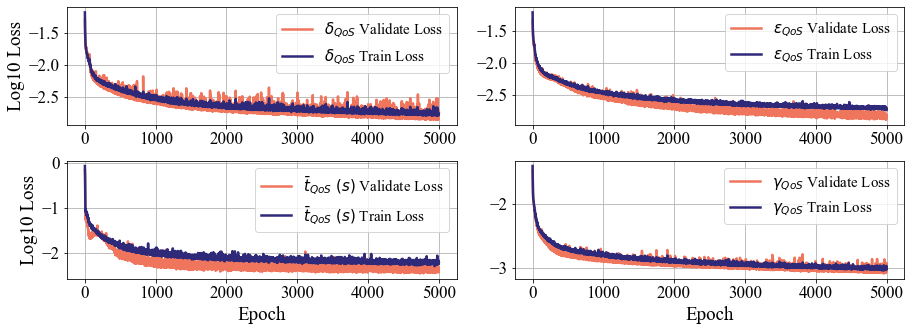

In [29]:
## Plot loss changes
fig, axes = plt.subplots( 2 , 2 , figsize=( 15 , 5 ) )
title_fontsize = 19
tick_size = 17
leg_size = 15
locator = [(0,0), (0,1), (1,0), (1,1)]
names   = ['$\delta_{QoS}$', '$\epsilon_{QoS}$', '$\\bar{t}_{QoS}\ (s)$', '$\gamma_{QoS}$']

for k in range(4):
    i , j = locator[k]
    name = names[k]
    axes[i,j].plot(np.log10(np.array(approximators[k].validate_loss)/(128*50)), label='%s Validate Loss'%name, linewidth=2.5, color='#ef755d')
    axes[i,j].plot(np.log10(np.array(approximators[k].train_loss)/(128*50)), label='%s Train Loss'%name, linewidth=2.5, color='#2e2a79')
    
    axes[i,j].grid()
    axes[i,j].legend(loc='upper right', fontsize=leg_size)

    axes[i,j].tick_params(axis='x', labelsize=tick_size)
    axes[i,j].tick_params(axis='y', labelsize=tick_size)
    
    if i == 1:
        axes[i,j].set_xlabel('Epoch', fontsize=title_fontsize)  
    if j == 0:
        axes[i,j].set_ylabel('Log10 Loss', fontsize=title_fontsize) 
        
plt.subplots_adjust(wspace=0.15, hspace=0.3)
plt.show()

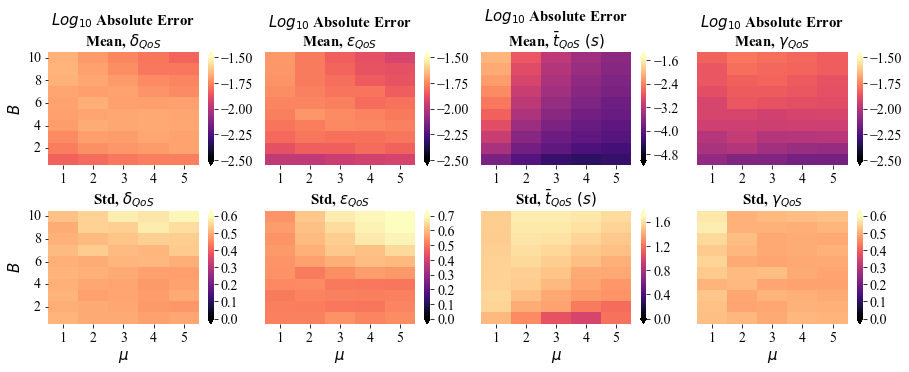

In [114]:
## Plot mean / std log Error
fig, axes = plt.subplots( 2 , 4 , figsize=( 15, 5 ) )
title_fontsize = 15
tick_size = 14
leg_size = 17

title = [['Log Mean Relative Error\nPoint-wise', 'Log Median Relative Error\nPoint-wise', 'Log Std Relative Error\nPoint-wise'],
         ['Log Mean Relative Error\nGrid-based', 'Log Median Relative Error\nGrid-based', 'Log Std Relative Error\nGrid-based']]


title = ['$\delta_{QoS}$', 
         '$\epsilon_{QoS}$', 
         '$\\bar{t}_{QoS}\ (s)$',
         '$\gamma_{QoS}$']


mean_colorbar_vmin  = [-2.5, -2.5, -5, -2.5]
mean_colorbar_nbins = [4, 4, 5, 4]

std_colorbar_vmax  = [0.6, 0.7, 1.7, 0.6]
std_colorbar_nbins = [7, 8, 5, 7]


for k in range(4):
    y_hat  = approximators[k](split_data_sets[k]['train'][:][0]).detach().numpy()
    y_true = split_data_sets[k]['train'][:][1].detach().numpy()
    mean_log_abs_error = np.log10(1e-5 + np.abs((y_true - y_hat))).mean(axis=0).reshape(recover_y_dim)
    std_log_abs_error  = np.log10(1e-5 + np.abs((y_true - y_hat))).std(axis=0).reshape(recover_y_dim)

    hp1 = sns.heatmap(np.flipud(mean_log_abs_error), ax=axes[0,k], vmin=mean_colorbar_vmin[k], vmax=-1.5, cmap='magma', # 'magma'
                         cbar_kws={'orientation': 'vertical', 'extend': 'both'})
    colorbar = hp1.collections[0].colorbar
    colorbar.ax.tick_params(labelsize=tick_size)
    colorbar.ax.yaxis.set_major_locator(MaxNLocator(nbins=mean_colorbar_nbins[k]))
        
    
    hp2 = sns.heatmap(np.flipud(std_log_abs_error), ax=axes[1,k], vmin=0, vmax=std_colorbar_vmax[k], cmap='magma', # 'magma'
                         cbar_kws={'orientation': 'vertical', 'extend': 'both'})
    
    colorbar = hp2.collections[0].colorbar
    colorbar.ax.tick_params(labelsize=tick_size)
    colorbar.ax.yaxis.set_major_locator(MaxNLocator(nbins=std_colorbar_nbins[k]))
    
    for i in [0,1]:
        axes[i,k].set_xticklabels(np.arange(1, 6))
        axes[i,k].tick_params(axis='x', labelsize=tick_size)
    axes[1,k].set_xlabel('$\mu$', fontsize=title_fontsize, fontweight='bold') 
    
    if k == 0 :  
        for i in [0,1]:
            axes[i,k].set_yticks([0.5, 2.5, 4.5, 6.5, 8.5] )
            axes[i,k].set_yticklabels([10, 8, 6, 4, 2])
            axes[i,k].tick_params(axis='y', labelsize=tick_size)
            axes[i,k].set_yticklabels(axes[i,k].get_yticklabels(), rotation=0)
            axes[i,k].set_ylabel('$B$', fontsize=title_fontsize, fontweight='bold')
    else:
        for i in [0,1]:
            axes[i,k].set_yticks([]) 
    
    axes[0,k].set_title("$Log_{10}$ Absolute Error\nMean, %s"%(title[k]), fontsize=title_fontsize, fontweight='bold')
    axes[i,k].set_title("Std, %s"%(title[k]), fontsize=title_fontsize, fontweight='bold')      
            
        
plt.subplots_adjust(wspace=0.15, hspace=0.4)
plt.show()